Environment: velocity

In [1]:
import pandas
import scanpy
import hdf5plugin
import anndata
import cellrank
import matplotlib
from matplotlib import pyplot
import cellrank
import numpy
import gseapy
import scipy
import seaborn
import scipy
import decoupler
import scvelo
import IPython
import single_cell_analysis
from pyscenic import aucell
import warnings
import numba
import cma
import concurrent.futures

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/ctxcore/__init__.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

In [3]:
# Plotting setup

figure_size = (5, 5)
fontsize = 14
scanpy.set_figure_params(figsize=figure_size, dpi=100, color_map="plasma", frameon=True, fontsize=fontsize)
pyplot.rcParams.update({"axes.grid": False})
warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Load data from Cellrank and SDEvelo

working_directory = "RNA Sequencing Data/"
base_name = "cellrank"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name}_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)
adata.obs["group"] = adata.obs["group"].cat.reorder_categories(["MEF", "mESC", "control", "Hic2"])

In [5]:
# Load adata with raw counts and filter

adata_raw = scanpy.read_h5ad(
    working_directory+f"/splice_counts.h5ad"
)

scanpy.pp.filter_genes(adata_raw, min_cells=20)
scanpy.pp.normalize_total(adata_raw, target_sum=1e6)
scanpy.pp.log1p(adata_raw)
adata_raw.obs = adata.obs
adata_raw.obsm = adata.obsm
adata_raw.uns["term_states_fwd_colors"] = adata.uns["term_states_fwd_colors"]
adata_raw.uns = adata.uns
adata.raw = adata_raw

print(adata_raw)

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'macrostate', 'clusters_gradients', 'fate_probabilities_Dead end', 'fate_probabilities_Stem cell', 'early_or_late', 'leiden'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'T_fwd_params', 'clusters_gradients_colors', 'coarse_fwd', 'diffmap_evals', 'diffmap_neighbors', 'draw_graph', 'eigendecomposition_fwd', 'group_colors', 'init_states_fwd_colors', 'leiden', 'leiden_colors', 'log1p', 'macrostate_colors', 'macrostates_fwd_colors', 'neighbors', 'pca', 'sample_colors', 'schur_matrix_fwd', 'sde_veloci

In [6]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [7]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)
single_cell_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_single_cell.csv", index_col=0)

In [8]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()

In [9]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

# Differentially expressed targets that are drivers of dead end
de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)

# Differentially expressed targets that are drivers of stem cells
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

# Score activities

In [25]:
network_genes = ["Hic2", "Klf4"]

In [11]:
# Get gene sets

cell_markers = gseapy.get_library("PanglaoDB_Augmented_2021", organism="Mouse")
epithelial_markers = numpy.array(pandas.Series(cell_markers["Epithelial Cells"]).str.capitalize())
keratinocyte_markers = numpy.array(pandas.Series(cell_markers["Keratinocytes"]).str.capitalize())
stem_cell_markers = numpy.array(pandas.Series(cell_markers["Pluripotent Stem Cells"]).str.capitalize())
fibroblast_markers = numpy.array(pandas.Series(cell_markers["Fibroblasts"]).str.capitalize())
msigdb = gseapy.get_library("MSigDB_Hallmark_2020", organism="Mouse")
p53_markers = numpy.array(pandas.Series(msigdb["p53 Pathway"]).str.capitalize())

In [12]:
# Define gene signatures

dead_end_de_df = pandas.read_csv("RNA Sequencing Data/macrostate_differential_expression_Dead end.csv", index_col=0)

p53_top_1000 = numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index)

signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_top_1000
}

aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_raw.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

In [13]:
# Run AUCell

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata and adata_raw

for gene_set in result.columns:
    adata.obs[f"{gene_set}_score"] = result[gene_set].copy()
    adata_raw.obs[f"{gene_set}_score"] = result[gene_set].copy()

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]

In [26]:
# Score activities of Hic2, Klf4 and Myc

conditions = ["Reprogramming", "MEF", "mESC", "iPSC", "Single-cell"]
lfc_columns = [f"{condition} LFC" for condition in conditions]
pval_columns = [f"{condition} p adjusted" for condition in conditions]

consistently_downregulated_df = bulk_de
for condition in conditions:
    consistently_downregulated_df = consistently_downregulated_df.query(f"`{condition} LFC` < 0")

consistently_downregulated = consistently_downregulated_df.index.to_list()
bulk_chipseq = numpy.intersect1d(consistently_downregulated, hic2_targets)
expression_df = pandas.DataFrame(data = adata.raw.X.toarray(), index=adata.obs_names, columns=adata.raw.var_names)
correlations = expression_df.drop(columns=["Hic2"]).corrwith(expression_df["Hic2"], method="pearson")
bulk_and_correlation = numpy.intersect1d(bulk_chipseq, correlations[correlations < -0.1].index)
weights = bulk_de.loc[bulk_and_correlation]["Single-cell LFC"]
hic2_network = pandas.DataFrame({"source": "Hic2", "weight": weights, "target": bulk_and_correlation})

# Load collectri
collectri_df = decoupler.op.collectri(organism="mouse")
# Remove unreliable signs
modified_collectri = collectri_df.query("sign_decision != 'default activation'")
# Remove autoregulation
modified_collectri = modified_collectri.query("not (source == target)")

# Combine CollecTRI and Hic2 network
collectri_genes = ["Klf4"]
myc_klf4_network = modified_collectri.query("source in @collectri_genes")[["source", "target", "weight"]]
network = pandas.concat([hic2_network, myc_klf4_network])

In [27]:
# Run ULM

decoupler.mt.ulm(adata, network, raw=True, bsize=1000000)
network_activities = []
for gene in network_genes:
    adata.obs[f"{gene}_activity"] = adata.obsm["score_ulm"][gene]
    network_activities.append(f"{gene}_activity")

In [28]:
# Rescale scores between 0 and 1

# For AUCell scores, set the max value to 1
for score in network_scores:
    max_value = numpy.max(adata.obs[score])
    adata.obs[score] /= max_value

# For ULM scores, bound them between 0 and 1
for activity in network_activities:
    adata.obs[activity] -= numpy.min(adata.obs[activity])
    adata.obs[activity] /= numpy.max(adata.obs[activity])

# Trends in real time

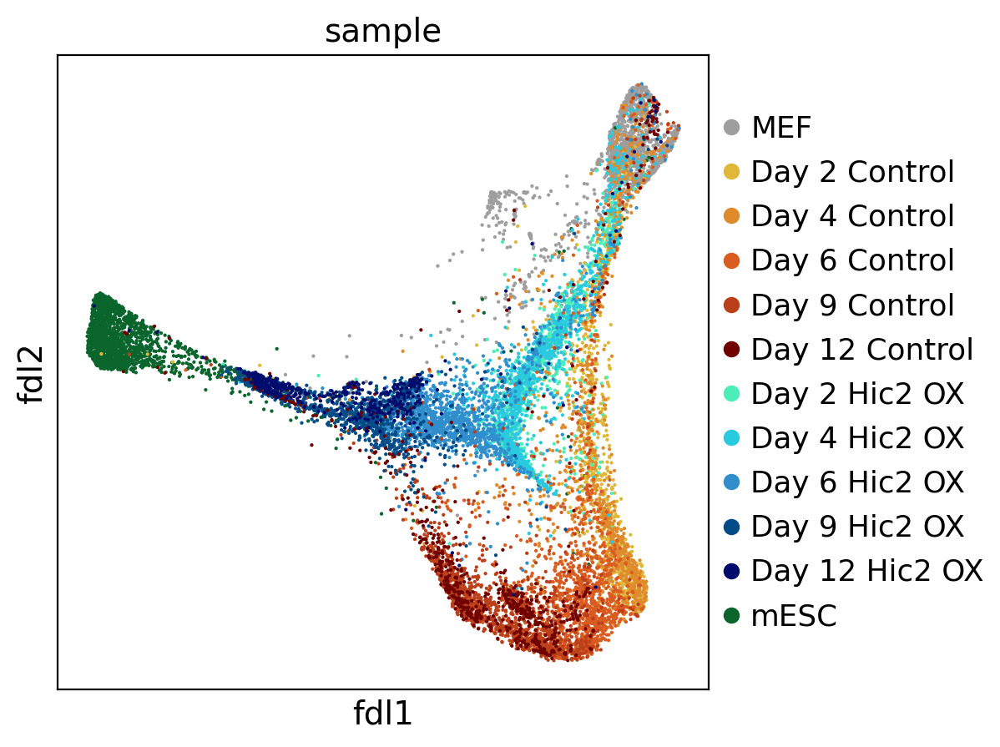

In [29]:
scanpy.pl.embedding(adata, "fdl", color=["sample"])

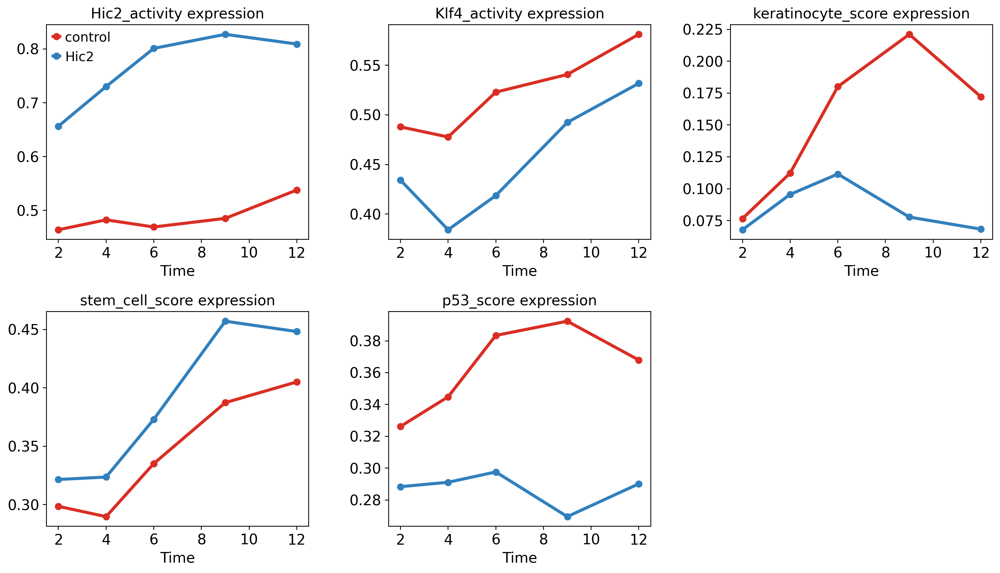

In [30]:
def plot_average_over_time(adata, genes, group_key="group", time_key="day", layer=None, groups="all", columns=4, figure_width=14, plot_height=4,
    obsm=False, show=True, errorbars=False):
    """
    Plots smoothed gene expression using generalized additive models (GAMs).
    This provides true smooth local regression with confidence intervals.
    """

    number_of_genes = len(genes)
    number_of_columns = min(columns, number_of_genes)
    
    # Calculate rows
    rows = (number_of_genes + number_of_columns - 1) // number_of_columns
    
    figure, axes = pyplot.subplots(rows, number_of_columns)
    figure.set_figwidth(figure_width)
    figure.set_figheight(plot_height * rows)

    # Handle single gene case (axes is not an array) and 1D array case
    if number_of_genes == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    # Define colors for groups
    unique_groups = adata.obs[group_key].cat.categories
    if f"{group_key}_colors" in adata.uns_keys():
        palette = adata.uns[f"{group_key}_colors"]
        color_map = dict(zip(unique_groups, palette))
    else:
        palette = seaborn.color_palette("tab10", n_colors=len(unique_groups))
        color_map = dict(zip(unique_groups, palette))


    for gene_index, gene in enumerate(genes):
        axis = axes_flat[gene_index]
        
        # Fetch expression data
        if obsm:
            expr_data = adata.obsm[layer][gene]
        else:
            if (layer == None and gene in adata.obs_keys()) or layer == "obs":
                expr_data = adata.obs[gene]
            elif layer == "raw":
                expr_data = adata.raw.to_adata()[:, gene].X
            elif layer == "X" or layer == None:
                expr_data = adata[:, gene].X
            else:
                expr_data = adata[:, gene].layers[layer]
        if hasattr(expr_data, "toarray"):
            expr_data = expr_data.toarray()
        if hasattr(expr_data, "flatten"):
            expr_data = expr_data.flatten()
        
        # Create DataFrame
        df = pandas.DataFrame({
            "Latent Time": adata.obs[time_key],
            "Expression": expr_data,
            "Group": adata.obs[group_key]
        })
        
        # Determine which groups to plot
        if groups == "all":
            # If no specific list, plot all groups found in the data
            plot_groups = df["Group"].unique()
        else:
            plot_groups = groups

        # Loop through each group and plot expression
        for group in plot_groups:
            group_data = df[df["Group"] == group]
            color = color_map[group]
            
            # Skip empty groups
            if len(group_data) < 10:
                continue

            # Prepare X and y
            X = group_data["Latent Time"].values
            y = group_data["Expression"].values

            time_points = group_data["Latent Time"].unique()
            
            # Calculate average expression
            averages = []
            ci_list = []
            for t in time_points:
                y_t = y[X == t]
                averages.append(y_t.mean())
                ci_list.append(scipy.stats.norm.ppf(0.975)*y_t.std())
            
            # Plot line
            axis.plot(time_points, averages, "o", linestyle="solid", label=group, color=color, linewidth=3)
            if errorbars:
                axis.errorbar(time_points, averages, yerr=ci_list, color=color, elinewidth=3, capsize=10)

        axis.set_title(f"{gene} expression")
        axis.set_xlabel("Time")
        
        # Add legend to the first plot
        if gene_index == 0:
            axis.legend()

    # Clean up empty subplots
    for i in range(number_of_genes, len(axes_flat)):
        axes_flat[i].axis('off')

    pyplot.tight_layout()
    if show:
        pyplot.show()
    else:
        return axes_flat
    
plot_average_over_time(adata, genes=network_activities+network_scores, groups=["control", "Hic2"], columns=3)

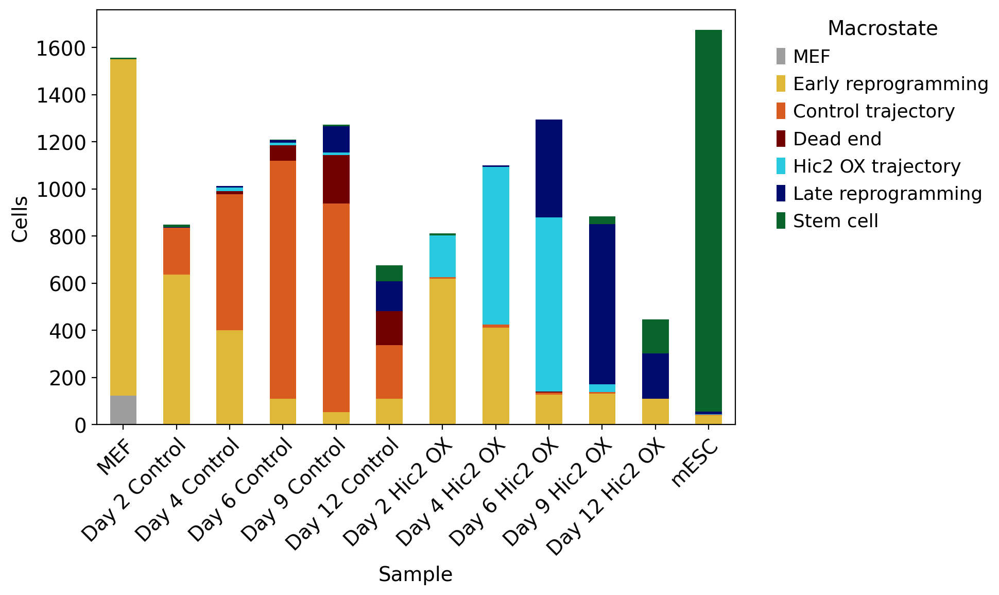

In [31]:
# Macrostate compositions in samples

single_cell_analysis.plot_group_composition(adata, group_key="sample", sample_key="macrostate", normalize=False)

# Plot trends for network components

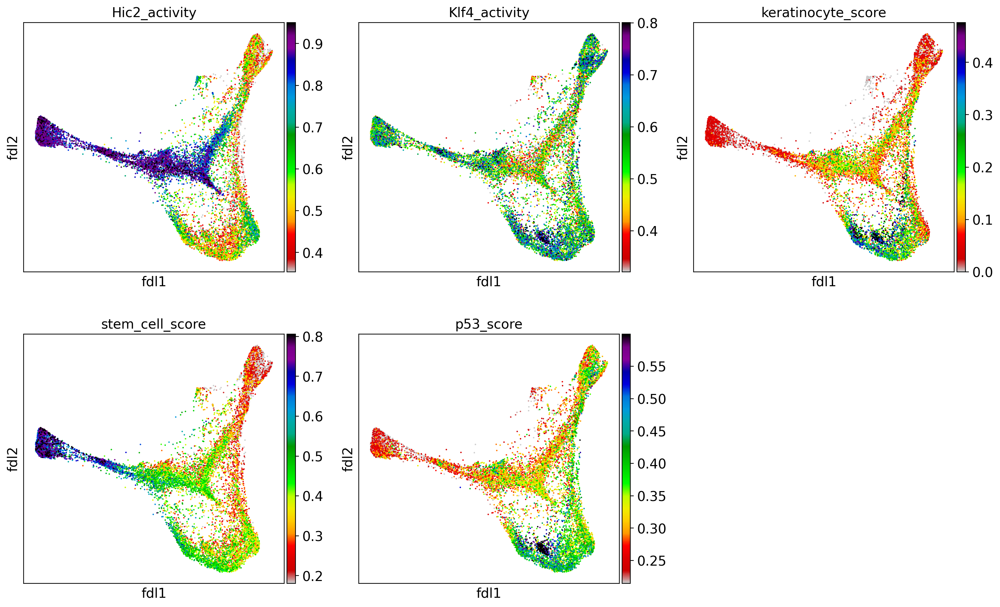

In [32]:
scanpy.pl.embedding(adata, "fdl", color=network_activities+network_scores, cmap="nipy_spectral_r", vmax="p99", vmin="p10", ncols=3)

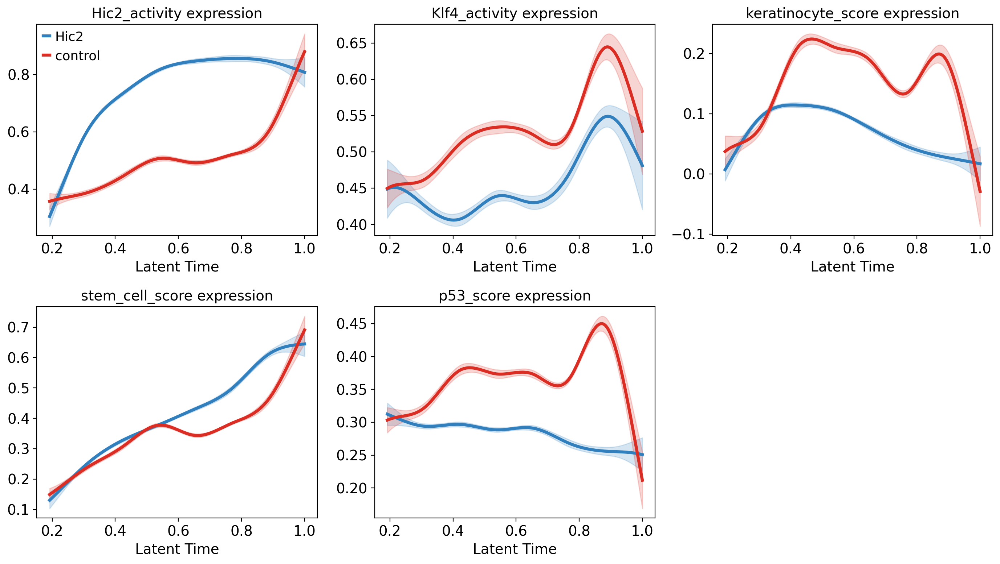

In [33]:
single_cell_analysis.plot_grouped_gene_trend(adata, network_activities+network_scores, groups=["Hic2", "control"], columns=3, n_splines=10)

  0%|          | 0/5 [00:00<?, ?gene/s]

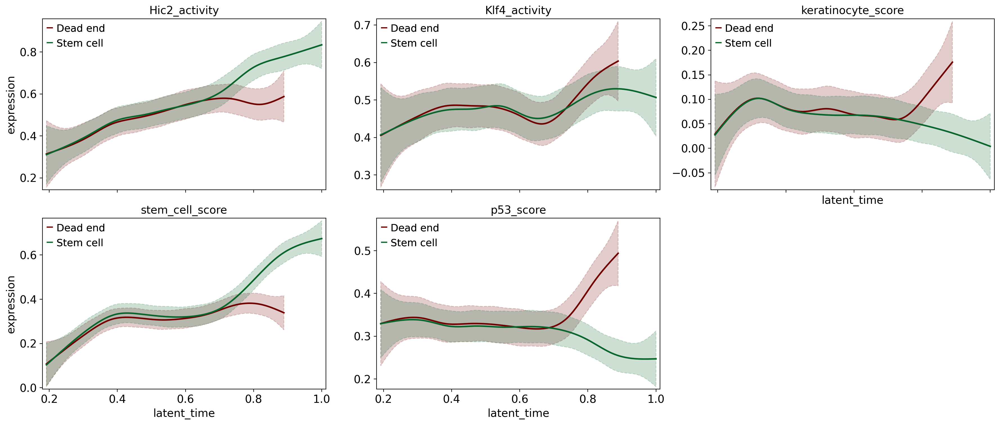

In [34]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_activities+network_scores, group_key="group", groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/5 [00:00<?, ?gene/s]

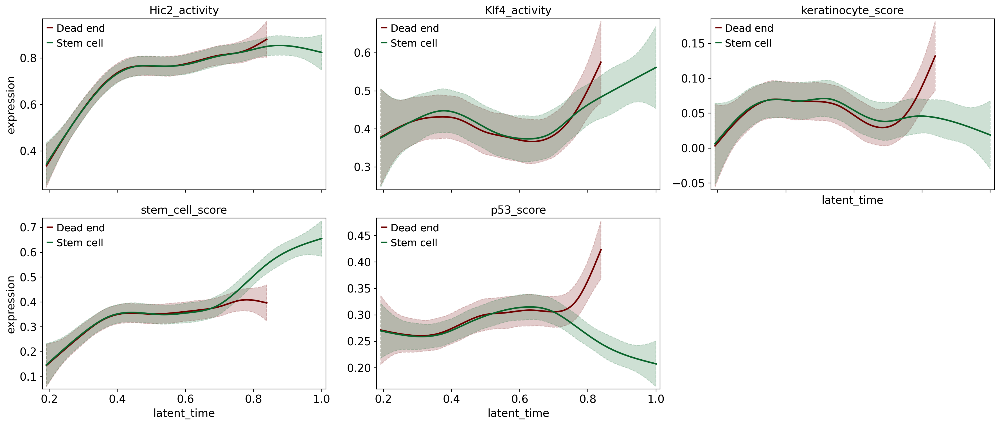

In [35]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_activities+network_scores, group_key="group", groups=["Hic2"], n_knots=10, n_columns=3)

# Functions for integrating stochastic differential equations

In [37]:
# Solver for stochastic differential equations
@numba.njit(nogil=True)
def euler_maruyama(time_array, derivatives_function, initial_values,
                     negatives = True, seed=None, parameters = numpy.empty(0)):
    species = initial_values.size
    dt = time_array[1] - time_array[0]
    concentration_matrix = numpy.zeros((time_array.size, species))
    concentration_matrix[0] = initial_values
    
    if not seed is None:
        numpy.random.seed(seed)
    
    for step_index in range(1, len(time_array)):
        t = time_array[step_index]
        xi = numpy.random.normal()
        concentrations = concentration_matrix[step_index-1]
        dc = derivatives_function(t, concentrations, dt, parameters)
        if negatives:
            new_concentrations = concentrations + dc
        else:
            new_concentrations = numpy.clip(concentrations + dc, a_min=0, a_max=None)
        concentration_matrix[step_index] = new_concentrations.copy()
    return concentration_matrix.T.copy()

In [39]:
@numba.njit(nogil=True)
def derivatives_function_stochastic(time, concentrations, dt, parameters):

    H = concentrations[0]
    K = concentrations[1]
    E = concentrations[2]
    S = concentrations[3]
    D = concentrations[4]

    alpha_H  = parameters[0]
    alpha_K  = parameters[1]
    alpha_E  = parameters[2]
    alpha_S  = parameters[3]
    alpha_KD = parameters[4]
    alpha_DD = parameters[5]
    
    beta_H   = parameters[6]
    beta_K   = parameters[7]
    
    delta_H  = parameters[8]
    delta_K  = parameters[9]
    delta_E  = parameters[10]
    delta_S  = parameters[11]
    delta_D  = parameters[12]
    
    eta_KH   = parameters[13]
    eta_HH   = parameters[14]
    eta_SK   = parameters[15]
    eta_HK   = parameters[16]
    eta_KK   = parameters[17]
    eta_KE   = parameters[18]
    eta_EE   = parameters[19]
    eta_HE   = parameters[20]
    eta_SE   = parameters[21]
    eta_KS   = parameters[22]
    eta_SS   = parameters[23]
    eta_ES   = parameters[24]
    eta_DS   = parameters[25]
    eta_KD   = parameters[26]
    eta_HD   = parameters[27]
    eta_DD   = parameters[28]
    
    kappa_KH = parameters[29]
    kappa_HH = parameters[30]
    kappa_SK = parameters[31]
    kappa_HK = parameters[32]
    kappa_KK = parameters[33]
    kappa_KE = parameters[34]
    kappa_EE = parameters[35]
    kappa_HE = parameters[36]
    kappa_SE = parameters[37]
    kappa_KS = parameters[38]
    kappa_SS = parameters[39]
    kappa_ES = parameters[40]
    kappa_DS = parameters[41]
    kappa_KD = parameters[42]
    kappa_HD = parameters[43]
    kappa_DD = parameters[44]

    sigma_H  = parameters[45]
    sigma_K  = parameters[46]
    sigma_E  = parameters[47]
    sigma_S  = parameters[48]
    sigma_D  = parameters[49]

    # Deterministic drift
    drift_H = alpha_H * ((K / kappa_KH)**eta_KH) / (1 + (K / kappa_KH)**eta_KH + (H / kappa_HH)**eta_HH) + beta_H - delta_H * H
    
    drift_K = alpha_K * ((S / kappa_SK)**eta_SK) / (1 + (S / kappa_SK)**eta_SK + (H / kappa_HK)**eta_HK + (K / kappa_KK)**eta_KK) + beta_K - delta_K * K
    
    drift_E = alpha_E * ((K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE) / (1 + (K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE + (H / kappa_HE)**eta_HE + (S / kappa_SE)**eta_SE) - delta_E * E
    
    drift_S = alpha_S * ((K / kappa_KS)**eta_KS + (S / kappa_SS)**eta_SS) / (1 + (K / kappa_KS)**eta_KS + (S / kappa_SS)**eta_SS + (E / kappa_ES)**eta_ES + (D / kappa_DS)**eta_DS) - delta_S * S
    
    drift_D = alpha_KD * ((K / kappa_KD)**eta_KD) / (1 + (K / kappa_KD)**eta_KD + (H / kappa_HD)**eta_HD) + alpha_DD * ((D / kappa_DD)**eta_DD) / (1 + (D / kappa_DD)**eta_DD) - delta_D * D

    dH = drift_H * dt + sigma_H * numpy.sqrt(dt) * numpy.random.normal()
    dK = drift_K * dt + sigma_K * numpy.sqrt(dt) * numpy.random.normal()
    dE = drift_E * dt + sigma_E * numpy.sqrt(dt) * numpy.random.normal()
    dS = drift_S * dt + sigma_S * numpy.sqrt(dt) * numpy.random.normal()
    dD = drift_D * dt + sigma_D * numpy.sqrt(dt) * numpy.random.normal()

    return numpy.array([dH, dK, dE, dS, dD])

In [85]:
# Read parameter values

parameter_value_df = pandas.read_csv("without_myc_2_parameter_values.csv")
default_parameters = parameter_value_df["start_value"].to_numpy()
control_parameters = default_parameters.copy()
beta_H_index = 7
control_parameters[beta_H_index] = 0

# Plotting functions

In [41]:
# Function for plotting concentrations

def plot_concentrations(time_array, concentration_matrix, species_names, species_colors=None):
    n_species = concentration_matrix.shape[0]
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    figure, axis = pyplot.subplots()
    for species_index, species in enumerate(species_names):
        species_color = species_colors[species_index]
        axis.plot(time_array, concentration_matrix[species_index], label=species, color=species_color)
    axis.legend()
    axis.grid(True)
    axis.set_xlabel("Time")
    axis.set_ylabel("Concentration")
    pyplot.show()

In [42]:
# Function for plotting concentrations

def plot_trajectories(time_array, trajectories, species_names, species_colors=None, alpha=1.0, n_columns=3, figure_width=12, row_height=4):
    if len(trajectories.shape) == 2:
        trajectories = trajectories.reshape((1, trajectories.shape[0], trajectories.shape[1]))
    n_species = trajectories.shape[1]
    n_trajectories = trajectories.shape[0]
    n_time_points = len(time_array)
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for species_index, species in enumerate(species_names):
        axis = axes_flat[species_index]
        species_color = species_colors[species_index]
        for trajectory in trajectories[:, species_index].reshape((n_trajectories, n_time_points)):
            # Only plot label for one trajectory

            axis.plot(time_array, trajectory, color=species_color, alpha=alpha)
        axis.grid(True)
        axis.set_title(species)
        axis.set_xlabel("Time")
        axis.set_ylabel("Concentration")
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

In [43]:
variable_names = ["Hic2", "Klf4", "Keratinocyte", "Stem cell", "Damage"]
variable_colors = ["#3180bd", "#a93ee1", "#eb684b", "#0a652c", "#a81918"]

# Define initial concentrations

In [86]:
# Get average MEF concentrations

initial_concentrations = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].mean(),
])
print(initial_concentrations)

[0.42505975 0.50011864 0.01968043 0.21503232 0.28623255]


It might be useful to randomly sample a fibroblast to use as the starting point instead, at least in the stochastic model.

In [87]:
# List of variable values in MEFs

mef_values = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].to_numpy(),
]).T

# Prepare for stochastic simulations

In [88]:
time_span = [0, 12]
dt = 1e-1

# extract real data and time from the anndata object

adata_hic2 = adata[adata.obs["group"] == "Hic2"]
hic2_concentrations = numpy.array([
    adata_hic2.obs["Hic2_activity"].to_numpy(),
    adata_hic2.obs["Klf4_activity"].to_numpy(),
    adata_hic2.obs["keratinocyte_score"].to_numpy(),
    adata_hic2.obs["stem_cell_score"].to_numpy(),
    adata_hic2.obs["p53_score"].to_numpy(),
]).T
hic2_time = adata_hic2.obs["day"].to_numpy(dtype=float)

adata_control = adata[adata.obs["group"] == "control"]
control_concentrations = numpy.array([
    adata_control.obs["Hic2_activity"].to_numpy(),
    adata_control.obs["Klf4_activity"].to_numpy(),
    adata_control.obs["keratinocyte_score"].to_numpy(),
    adata_control.obs["stem_cell_score"].to_numpy(),
    adata_control.obs["p53_score"].to_numpy(),
]).T
control_time = adata_control.obs["day"].to_numpy(dtype=float)

In [89]:
# Function for generating trajectories

@numba.njit(nogil=True)
def generate_trajectories(time_span, derivatives_function, dt=1e-1,
                     seed=None, parameters = numpy.empty(0), n_trajectories=1000):
    time_array = numpy.arange(time_span[0], time_span[1]+dt, dt)
    n_time_points = len(time_array)
    n_species = len(mef_values[0])
    results = numpy.empty((n_trajectories, n_species, n_time_points))
    n_mef_cells = len(mef_values)
    if not seed is None:
        numpy.random.seed(seed)
    for i in range(n_trajectories):
        initial_cell_index = numpy.random.randint(n_mef_cells)
        initial_concentrations = mef_values[initial_cell_index]
        concentration_matrix = euler_maruyama(time_array, derivatives_function, initial_concentrations, seed=None, parameters=parameters, negatives=False)
        results[i] = concentration_matrix
    return time_array, results

In [90]:
%timeit generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=0, parameters=default_parameters, n_trajectories=500)

32.9 ms ± 94.3 μs per loop (mean ± std. dev. of 7 runs, 1 loop each)


In [91]:
# MMD function

@numba.njit(nogil=True)
def mmd_rbf(X, Y, bandwidths):
    n_X = X.shape[0]
    n_Y = Y.shape[0]
    n_features = X.shape[1]
    n_bandwidths = bandwidths.shape[0]

    # precompute inverse bandwidths to replace division with multiplication
    inv_two_bandwidths = numpy.zeros(n_bandwidths)
    for b in range(n_bandwidths):
        inv_two_bandwidths[b] = 1.0 / (2.0 * bandwidths[b])

    sum_XX = 0.0
    for i in range(n_X):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - X[j, k])**2
            for b in range(n_bandwidths):
                sum_XX += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_YY = 0.0
    for i in range(n_Y):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (Y[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_YY += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_XY = 0.0
    for i in range(n_X):
        for j in range(n_Y):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_XY += numpy.exp(-distance_squared * inv_two_bandwidths[b])

    mmd_squared = (sum_XX / (n_X * (n_X - 1.0))) - (2.0 * sum_XY / (n_X * n_Y)) + (sum_YY / (n_Y * (n_Y - 1.0)))
    loss = max(0.0, mmd_squared)
    return loss

@numba.njit(nogil=True)
def mmd_cost_function(time_array, trajectories, real_time, real_concentrations):
    # bandwidths = numpy.array([0.01, 0.1, 0.5, 1, 10])
    # bandwidths = numpy.array([0.5])
    bandwidths = numpy.array([0.1, 1, 5])
    
    mmd_total = 0.0
    unique_times = numpy.unique(real_time)

    for i in range(len(unique_times)):
        time = unique_times[i]
        
        real_time_indices = numpy.where(real_time == time)[0]
        real_concentrations_timepoint = real_concentrations[real_time_indices]
        
        sim_time_index = numpy.argmax(time_array == time)
        sim_data_timepoint = trajectories[:, :, sim_time_index]

        mmd_total += mmd_rbf(real_concentrations_timepoint, sim_data_timepoint, bandwidths)

    return mmd_total

# Time MMD function

# execute the simulation
time_array, results = generate_trajectories(time_span, derivatives_function_stochastic, n_trajectories=500, parameters=default_parameters)

print(mmd_cost_function(time_array, results, hic2_time, hic2_concentrations))
%timeit mmd_cost_function(time_array, results, hic2_time, hic2_concentrations)

12.22068629193159
70.3 ms ± 180 μs per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [92]:
# Function for evaluating parameters

@numba.njit(nogil=True)
def evaluate_parameters(parameters, loss_function=mmd_cost_function, time_span=(0, 12), derivatives_function=derivatives_function_stochastic, n_trajectories=500, seed=0, dt=1e-1):
    # Run Hic2 simulation
    time_array, hic2_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
    # Run control simulation
    control_parameters = parameters.copy()
    control_parameters[beta_H_index] = 0 # Set beta_H to 0
    time_array, control_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=control_parameters, n_trajectories=n_trajectories)

    hic2_loss = loss_function(time_array, hic2_results, hic2_time, hic2_concentrations)
    control_loss = loss_function(time_array, control_results, control_time, control_concentrations)
    loss = hic2_loss + control_loss

    return loss

print(evaluate_parameters(default_parameters))
%timeit evaluate_parameters(default_parameters, n_trajectories=500, dt=1e-1)

19.71946750965442
195 ms ± 9.66 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


500 control and 500 Hic2 trajectories can be tested in about 200 ms with MMD with three bandwidths and dt=1e-1. This seems to be sufficient for an accurate loss estimation. When there are $n$ real samples and $m$ simulated samples the error scales proportionally to $1/\sqrt{n} + 1/\sqrt{m}$. 1000 trajectories takes about 300 ms.

# Parameter optimization

In [93]:
# Parameter optimization with parallelization

# read the parameter configuration
initial_parameters = parameter_value_df["start_value"].to_numpy()
lower_bounds = parameter_value_df["lower_bound"].to_numpy()
upper_bounds = parameter_value_df["upper_bound"].to_numpy()

initial_sigma = 0.2

cma_options = {
    "bounds": [lower_bounds, upper_bounds],
    "seed": 0,
    "maxfevals": 100000,
    "popsize": 32, 
    "verbose": 1
}

# instantiate a thread pool executor
# letting it default to the number of logical processors on your machine
with concurrent.futures.ThreadPoolExecutor() as executor:
    
    # define a wrapper function that cma will call
    # it takes a list of parameter arrays and returns a list of cost values
    def parallel_evaluation(solutions):
        return list(executor.map(evaluate_parameters, solutions))

    # execute the optimization loop
    # note that objective_function is set to None when using parallel_objective
    best_parameters, evolution_strategy = cma.fmin2(
        objective_function=None,
        x0=initial_parameters,
        sigma0=initial_sigma,
        options=cma_options,
        parallel_objective=parallel_evaluation
    )

print("optimization completed.")
print("best function value: ", evolution_strategy.result.fbest)
print("optimal parameter array: ", best_parameters)

(16_w,32)-aCMA-ES (mu_w=9.2,w_1=19%) in dimension 50 (seed=197105, Tue Apr 14 11:38:29 2026)
Iterat #Fevals   function value  axis ratio  sigma  min&max std  t[m:s]
    1     32 7.741135871963019e+00 1.0e+00 1.90e-01  3e-02  2e-01 0:00.5
    2     64 5.846494913287314e+00 1.0e+00 1.86e-01  3e-02  2e-01 0:00.9
    3     96 8.686983136579586e+00 1.1e+00 1.84e-01  3e-02  2e-01 0:01.4
   10    320 7.663785312697778e+00 1.2e+00 1.87e-01  3e-02  2e-01 0:04.4
   20    640 6.682664807793516e+00 1.3e+00 1.98e-01  3e-02  2e-01 0:08.7
   32   1024 4.617980194275876e+00 1.5e+00 1.84e-01  3e-02  2e-01 0:13.9
   46   1472 3.018772782723806e+00 1.6e+00 1.77e-01  3e-02  2e-01 0:20.0
   59   1888 3.233814074120725e+00 1.7e+00 1.68e-01  3e-02  2e-01 0:27.0
   78   2496 3.261893788020101e+00 1.8e+00 1.69e-01  3e-02  2e-01 0:35.2
   99   3168 3.428517945979571e+00 1.9e+00 1.67e-01  3e-02  2e-01 0:44.2
  100   3200 3.291225706753652e+00 1.9e+00 1.68e-01  3e-02  2e-01 0:44.7
  125   4000 3.423123396042855e+

In [94]:
# Save parameters

numpy.savetxt("parameters_cmaes_without_myc_2_100000.txt", best_parameters)

In [95]:
# Load parameters

best_parameters = numpy.loadtxt("parameters_cmaes_without_myc_2_100000.txt")

In [96]:
best_control = best_parameters.copy()
best_control[beta_H_index] = 0

# Test parameters

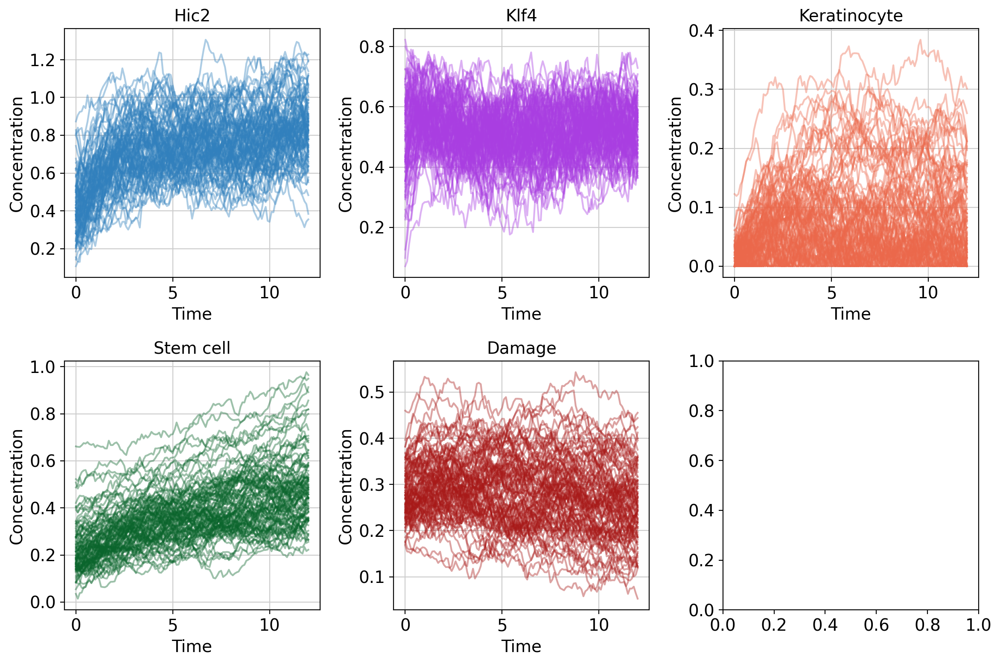

In [97]:
# Generate and plot trajectories with Hic2 OX

hic2_time_array, hic2_trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=0, parameters=best_parameters, n_trajectories=100)
plot_trajectories(hic2_time_array, hic2_trajectories, species_names=variable_names, species_colors=variable_colors, alpha=0.4)

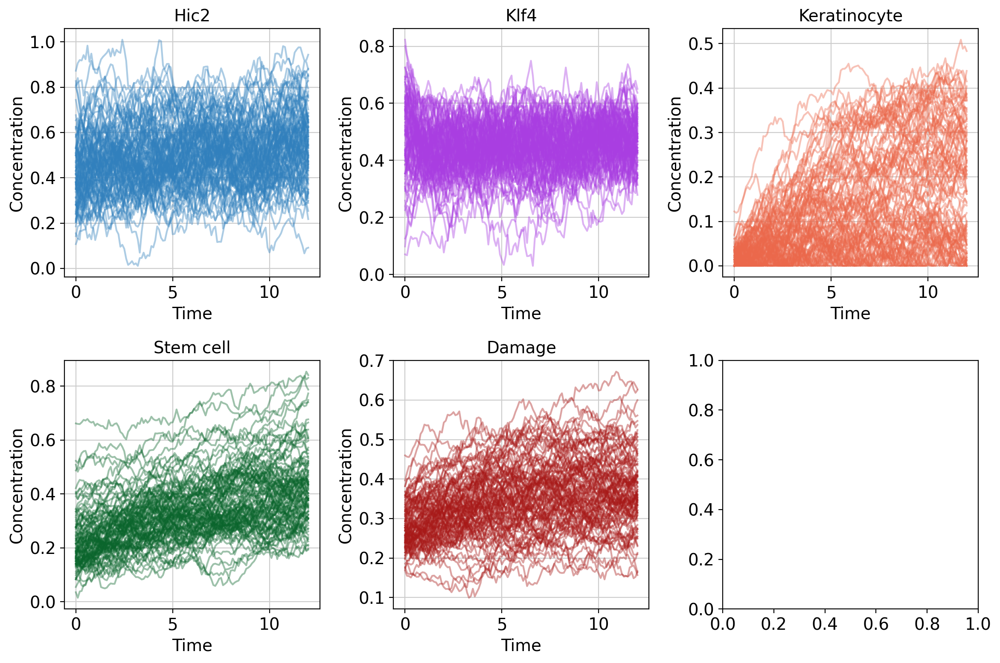

In [98]:
# Control trajectories

time_array, trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=0, parameters=best_control, n_trajectories=100)
plot_trajectories(time_array, trajectories, species_names=variable_names, species_colors=variable_colors, alpha=0.4)

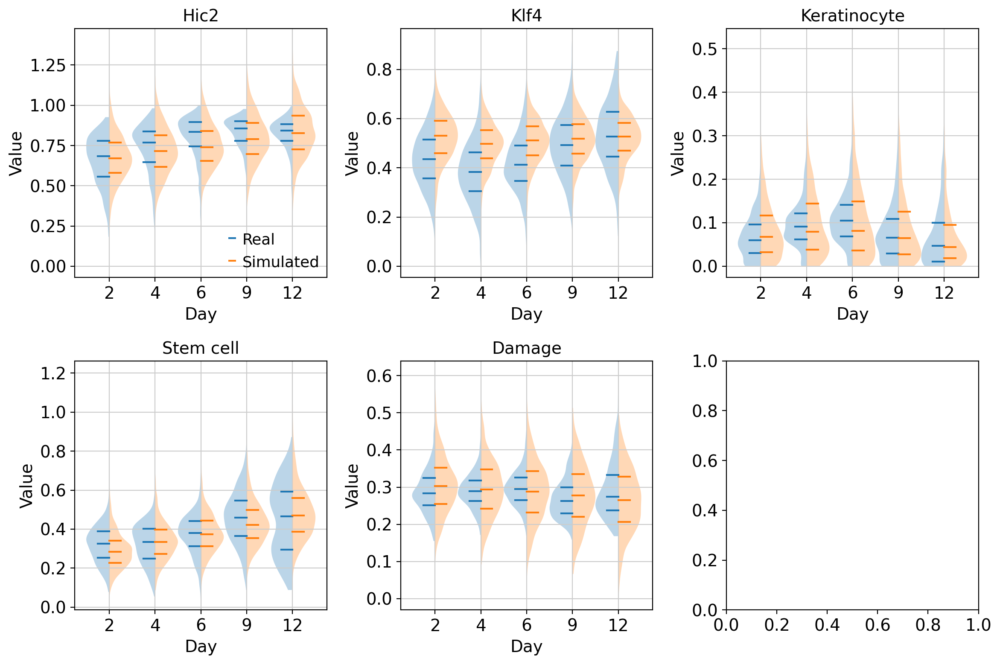

In [99]:
# Compare cells at different time points

obs_features = network_activities+network_scores

def compare_violin(adata, time_array, trajectories, group, n_columns=3, figure_width=12, row_height=4):

    n_species = trajectories.shape[1]
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    group_adata = adata[adata.obs["group"] == group]
    time_points = group_adata.obs["day"].unique()
    for feature_index in range(n_species):
        axis = axes_flat[feature_index]
        feature = obs_features[feature_index]
        real_data = group_adata.obs[feature]
        simulated_data = trajectories[:, feature_index, :]
        real_distributions = []
        simulated_distributions = []
        for time in time_points:
            real_distribution = real_data[group_adata.obs["day"] == time].to_numpy()
            real_distributions.append(real_distribution)
            simulated_distribution = simulated_data[:, time_array == time].reshape(-1)
            simulated_distributions.append(simulated_distribution)
        violin_width = 1
        violin_positions = time_points.to_numpy()
        violin_positions = numpy.array(range(len(time_points)))
        violin_offset = 0.0
        real_violin = axis.violinplot(real_distributions, positions = violin_positions-violin_offset, widths=violin_width,
                                      quantiles=[[0.25, 0.50, 0.75]]*len(time_points), showextrema=False, side="low")
        simulated_violin = axis.violinplot(simulated_distributions, positions = violin_positions+violin_offset, widths=violin_width,
                                           quantiles=[[0.25, 0.50, 0.75]]*len(time_points), showextrema=False, side="high")

        axis.set_xticks(violin_positions, labels=time_points)
        axis.grid(True)
        axis.set_title(variable_names[feature_index])
        axis.set_xlabel("Day")
        axis.set_ylabel("Value")

        if feature_index==0:
            axis.legend(handles = [real_violin["cquantiles"], simulated_violin["cquantiles"]], labels=["Real", "Simulated"])
    
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

hic2_time_array, hic2_trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=1, parameters=best_parameters, n_trajectories=1000)
compare_violin(adata, hic2_time_array, hic2_trajectories, "Hic2")

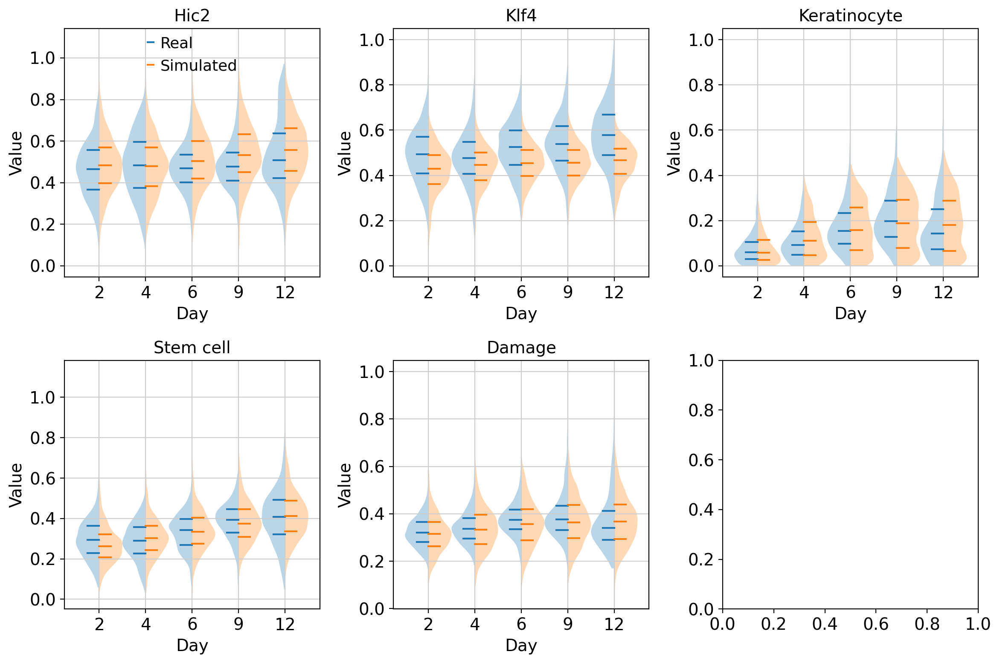

In [100]:
# Compare control distributions

control_time_array, control_trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=1, parameters=best_control, n_trajectories=1000)
compare_violin(adata, control_time_array, control_trajectories, "control")

In [101]:
# Create AnnData objects from simulated trajectories

def trajectories_to_adata(time_array, trajectories, group = None, var_names = ["Hic2", "Klf4", "Keratinocyte", "Stem cell", "Damage"]):
    n_trajectories = trajectories.shape[0]
    n_features = trajectories.shape[1]
    n_time_points = len(time_array)

    X = numpy.moveaxis(trajectories, 1, 2).reshape((-1, n_features))
    time_series = numpy.array([time_array]*n_trajectories).flatten()

    adata = scanpy.AnnData(X)
    adata.var_names = var_names
    adata.obs["day"] = time_series
    adata.obs["group"] = group
    adata.obs["group"] = pandas.Series(adata.obs["group"], dtype="category")
    return adata

hic2_time_array, hic2_trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=0, parameters=best_parameters, n_trajectories=500)
control_time_array, control_trajectories = generate_trajectories(time_span, derivatives_function_stochastic, dt=1e-1, seed=1, parameters=best_control, n_trajectories=500)

adata_hic2_simulated = trajectories_to_adata(hic2_time_array, hic2_trajectories, group = "Hic2")
adata_control_simulated = trajectories_to_adata(control_time_array, control_trajectories, group = "control")
adata_simulated = scanpy.concat([adata_hic2_simulated, adata_control_simulated])
adata_simulated.uns["group_colors"] = [
    "#3180bd",
    "#da2e24",
]

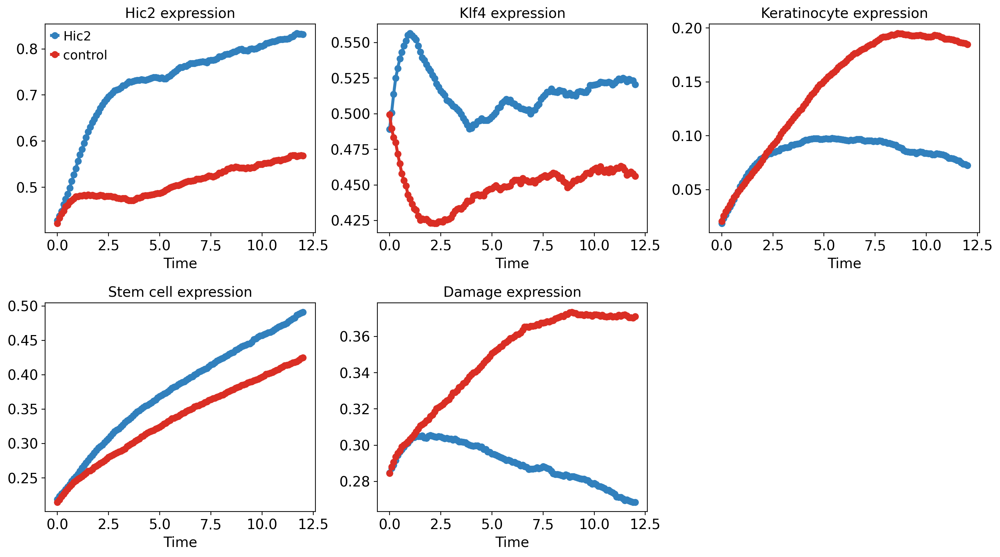

In [102]:
plot_average_over_time(adata_simulated, genes=["Hic2", "Klf4", "Keratinocyte", "Stem cell", "Damage"], columns=3)

# Quick deterministic optimization

In [103]:
@numba.njit(nogil=True)
def derivatives_function_deterministic(time, concentrations, parameters):

    H = concentrations[0]
    K = concentrations[1]
    E = concentrations[2]
    S = concentrations[3]
    D = concentrations[4]

    alpha_H  = parameters[0]
    alpha_K  = parameters[1]
    alpha_E  = parameters[2]
    alpha_S  = parameters[3]
    alpha_KD = parameters[4]
    alpha_DD = parameters[5]
    
    beta_H   = parameters[6]
    beta_K   = parameters[7]
    
    delta_H  = parameters[8]
    delta_K  = parameters[9]
    delta_E  = parameters[10]
    delta_S  = parameters[11]
    delta_D  = parameters[12]
    
    eta_KH   = parameters[13]
    eta_HH   = parameters[14]
    eta_SK   = parameters[15]
    eta_HK   = parameters[16]
    eta_KK   = parameters[17]
    eta_KE   = parameters[18]
    eta_EE   = parameters[19]
    eta_HE   = parameters[20]
    eta_SE   = parameters[21]
    eta_KS   = parameters[22]
    eta_SS   = parameters[23]
    eta_ES   = parameters[24]
    eta_DS   = parameters[25]
    eta_KD   = parameters[26]
    eta_HD   = parameters[27]
    eta_DD   = parameters[28]
    
    kappa_KH = parameters[29]
    kappa_HH = parameters[30]
    kappa_SK = parameters[31]
    kappa_HK = parameters[32]
    kappa_KK = parameters[33]
    kappa_KE = parameters[34]
    kappa_EE = parameters[35]
    kappa_HE = parameters[36]
    kappa_SE = parameters[37]
    kappa_KS = parameters[38]
    kappa_SS = parameters[39]
    kappa_ES = parameters[40]
    kappa_DS = parameters[41]
    kappa_KD = parameters[42]
    kappa_HD = parameters[43]
    kappa_DD = parameters[44]

    sigma_H  = parameters[45]
    sigma_K  = parameters[46]
    sigma_E  = parameters[47]
    sigma_S  = parameters[48]
    sigma_D  = parameters[49]

    # Deterministic drift
    drift_H = alpha_H * ((K / kappa_KH)**eta_KH) / (1 + (K / kappa_KH)**eta_KH + (H / kappa_HH)**eta_HH) + beta_H - delta_H * H
    
    drift_K = alpha_K * ((S / kappa_SK)**eta_SK) / (1 + (S / kappa_SK)**eta_SK + (H / kappa_HK)**eta_HK + (K / kappa_KK)**eta_KK) + beta_K - delta_K * K
    
    drift_E = alpha_E * ((K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE) / (1 + (K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE + (H / kappa_HE)**eta_HE + (S / kappa_SE)**eta_SE) - delta_E * E
    
    drift_S = alpha_S * ((K / kappa_KS)**eta_KS + (S / kappa_SS)**eta_SS) / (1 + (K / kappa_KS)**eta_KS + (S / kappa_SS)**eta_SS + (E / kappa_ES)**eta_ES + (D / kappa_DS)**eta_DS) - delta_S * S
    
    drift_D = alpha_KD * ((K / kappa_KD)**eta_KD) / (1 + (K / kappa_KD)**eta_KD + (H / kappa_HD)**eta_HD) + alpha_DD * ((D / kappa_DD)**eta_DD) / (1 + (D / kappa_DD)**eta_DD) - delta_D * D

    return numpy.array([drift_H, drift_K, drift_E, drift_S, drift_D])

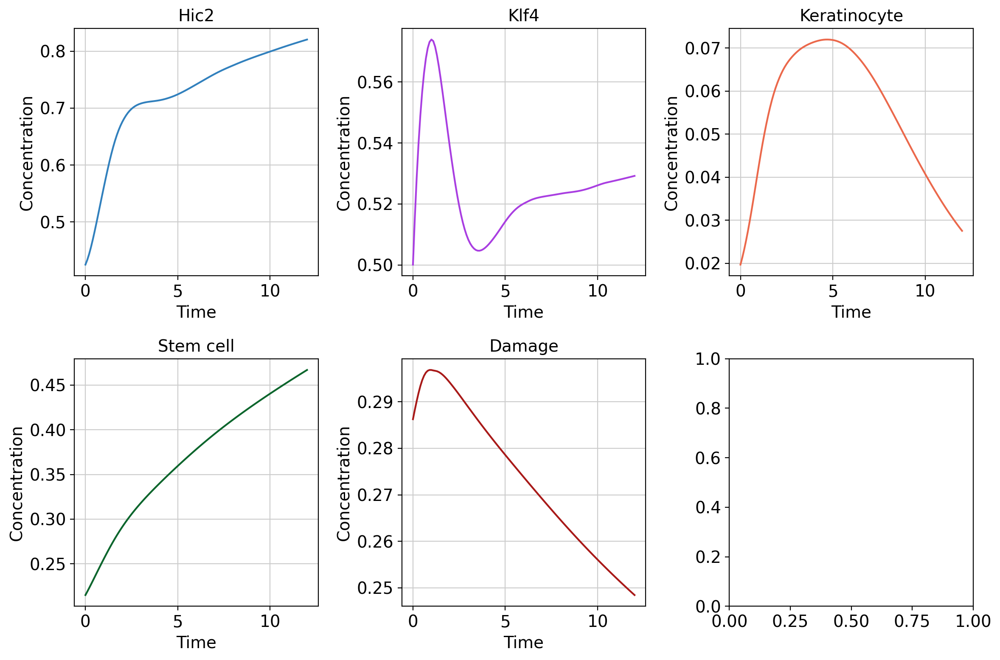

In [105]:
result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[best_parameters], t_eval=time_array)
plot_trajectories(result.t, result.y, species_names=variable_names, species_colors=variable_colors, alpha=1)

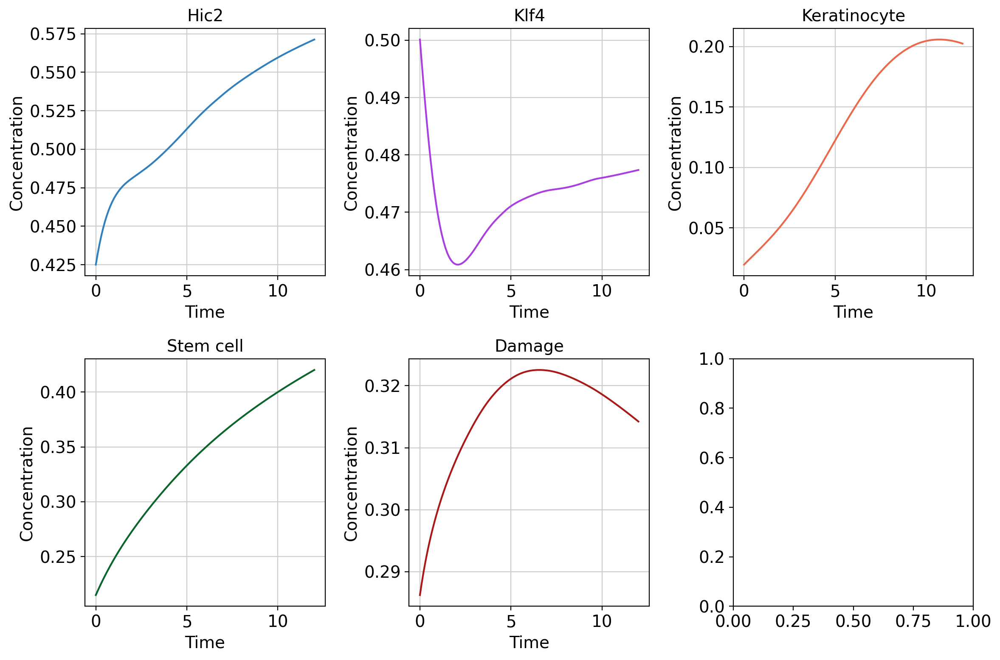

In [106]:
# Control system
result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[best_control], t_eval=time_array)
plot_trajectories(result.t, result.y, species_names=variable_names, species_colors=variable_colors, alpha=1)